In [1]:
!pip install -Uqq fastai
!pip install -Uqq duckduckgo-search
!pip install -Uqq fastai2

from duckduckgo_search import ddg_images
from fastcore.all import *
from fastdownload import download_url
from fastai.vision.all import *
from time import sleep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.4/179.4 kB 4.0 MB/s eta 0:00:00


In [2]:
def search_images(term, max_images=30):
    print(f"Searching for '{term}'")
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

In [3]:
dog_breeds = [
    "Labrador Retriever",
    "German Shepherd",
    "Golden Retriever",
    "French Bulldog",
    "Bulldog",
    "Poodle",
    "Beagle",
    "Rottweiler",
    "Yorkshire Terrier",
    "Boxer",
    "Dachshund",
    "Siberian Husky",
    "Australian Shepherd",
    "Great Dane",
    "Chihuahua",
    "Shih Tzu",
    "Boston Terrier",
    "Pomeranian",
    "Cavalier King Charles Spaniel",
    "Doberman Pinscher",
    "Border Collie",
    "Shetland Sheepdog",
    "Bichon Frise",
    "Pembroke Welsh Corgi",
    "Miniature Schnauzer",
    "Bull Terrier",
    "Cocker Spaniel",
    "Maltese",
    "Newfoundland",
    "Scottish Terrier",
    "Bernese Mountain Dog",
    "Pug",
    "English Springer Spaniel",
    "Havanese",
    "Vizsla",
    "West Highland White Terrier",
    "Shiba Inu",
    "Dalmatian",
    "Basset Hound",
    "Collie",
    "Weimaraner"
]

In [4]:
path = Path('dog_breed')

for o in dog_breeds:
  dest = path/o
  dest.mkdir(exist_ok=True, parents=True)
  download_images(dest, urls=search_images(f'{o} dog high definition photo'))
  sleep(10)
  download_images(dest, urls=search_images(f'{o} puppy high definition photo'))
  sleep(10)
  resize_images(path/o, max_size=480, dest=path/o)

Searching for 'Labrador Retriever dog high definition photo'
Searching for 'Labrador Retriever puppy high definition photo'
Searching for 'German Shepherd dog high definition photo'
Searching for 'German Shepherd puppy high definition photo'
Searching for 'Golden Retriever dog high definition photo'
Searching for 'Golden Retriever puppy high definition photo'
Searching for 'French Bulldog dog high definition photo'
Searching for 'French Bulldog puppy high definition photo'
Searching for 'Bulldog dog high definition photo'
Searching for 'Bulldog puppy high definition photo'
Searching for 'Poodle dog high definition photo'
Searching for 'Poodle puppy high definition photo'
Searching for 'Beagle dog high definition photo'
Searching for 'Beagle puppy high definition photo'
Searching for 'Rottweiler dog high definition photo'
Searching for 'Rottweiler puppy high definition photo'


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Searching for 'Yorkshire Terrier dog high definition photo'
Searching for 'Yorkshire Terrier puppy high definition photo'
Searching for 'Boxer dog high definition photo'
Searching for 'Boxer puppy high definition photo'
Searching for 'Dachshund dog high definition photo'
Searching for 'Dachshund puppy high definition photo'
Searching for 'Siberian Husky dog high definition photo'
Searching for 'Siberian Husky puppy high definition photo'
Searching for 'Australian Shepherd dog high definition photo'
Searching for 'Australian Shepherd puppy high definition photo'
Searching for 'Great Dane dog high definition photo'
Searching for 'Great Dane puppy high definition photo'
Searching for 'Chihuahua dog high definition photo'
Searching for 'Chihuahua puppy high definition photo'
Searching for 'Shih Tzu dog high definition photo'
Searching for 'Shih Tzu puppy high definition photo'
Searching for 'Boston Terrier dog high definition photo'
Searching for 'Boston Terrier puppy high definition photo

In [5]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

30

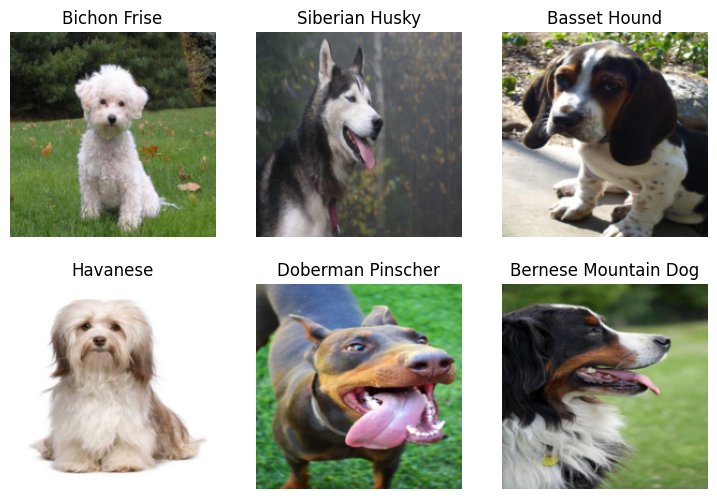

In [6]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

dls.show_batch(max_n=6)

In [7]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 85.5MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,2.719140,0.763783,0.225806,04:46


epoch,train_loss,valid_loss,error_rate,time
0,0.745637,0.585430,0.165591,06:41
1,0.450212,0.503416,0.135484,06:45
2,0.243784,0.525287,0.135484,06:45


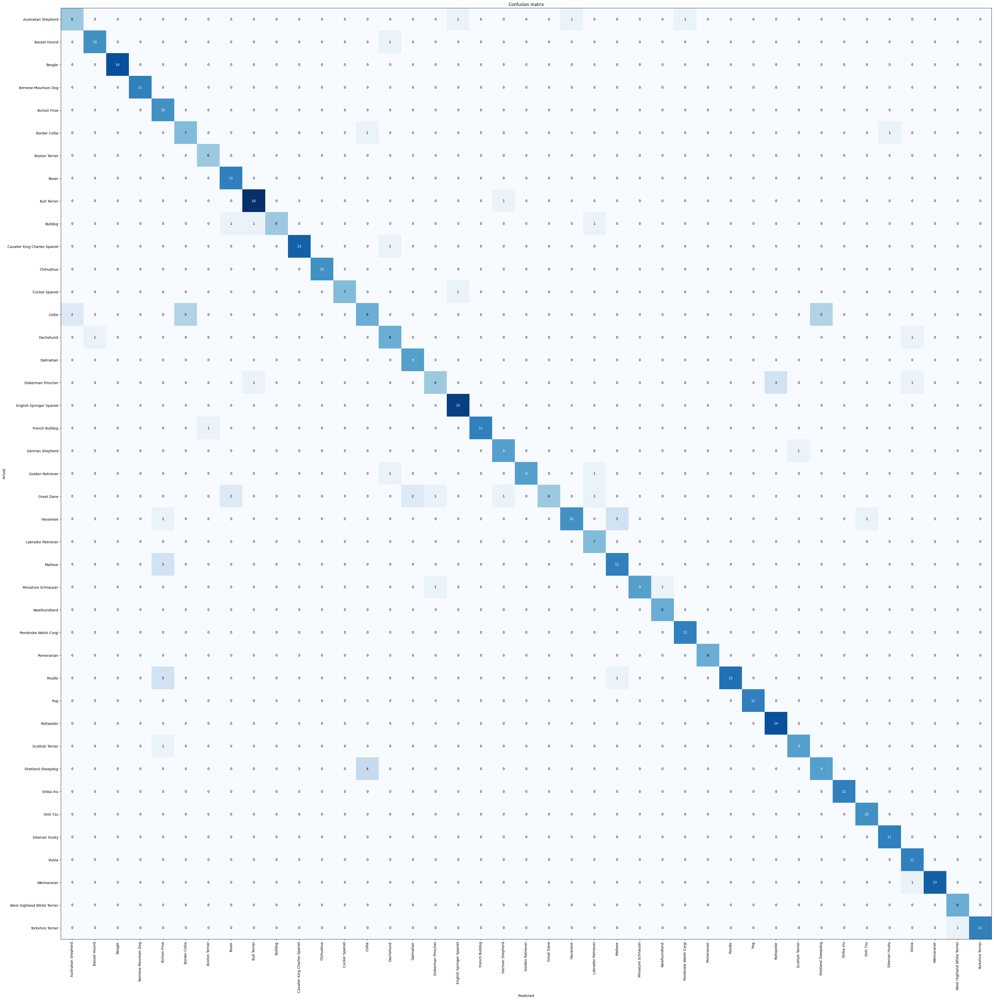

In [8]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(40, 40))

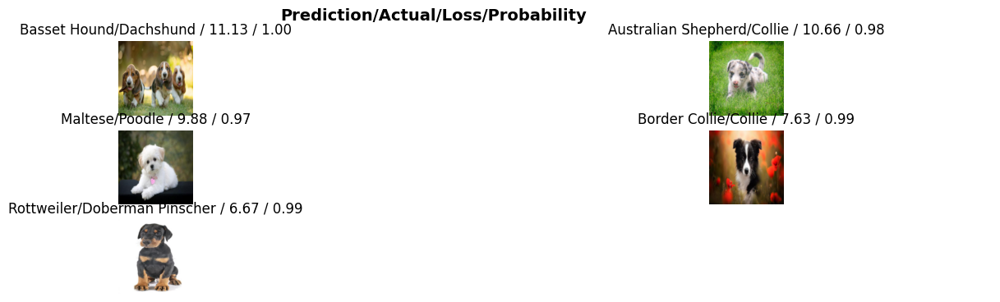

In [9]:
interp.plot_top_losses(5, nrows=3, figsize=(17,4))

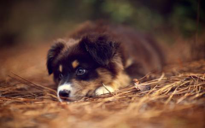

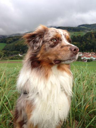

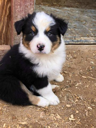

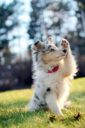

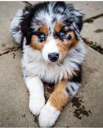

...

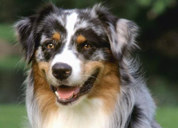

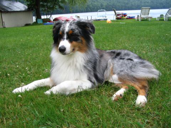

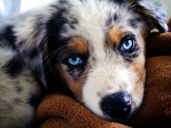

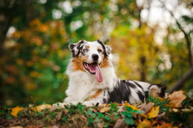

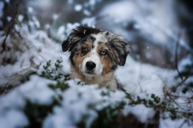

In [10]:
from fastai.vision.widgets import ImageClassifierCleaner

cleaner = ImageClassifierCleaner(learn)
cleaner

In [14]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

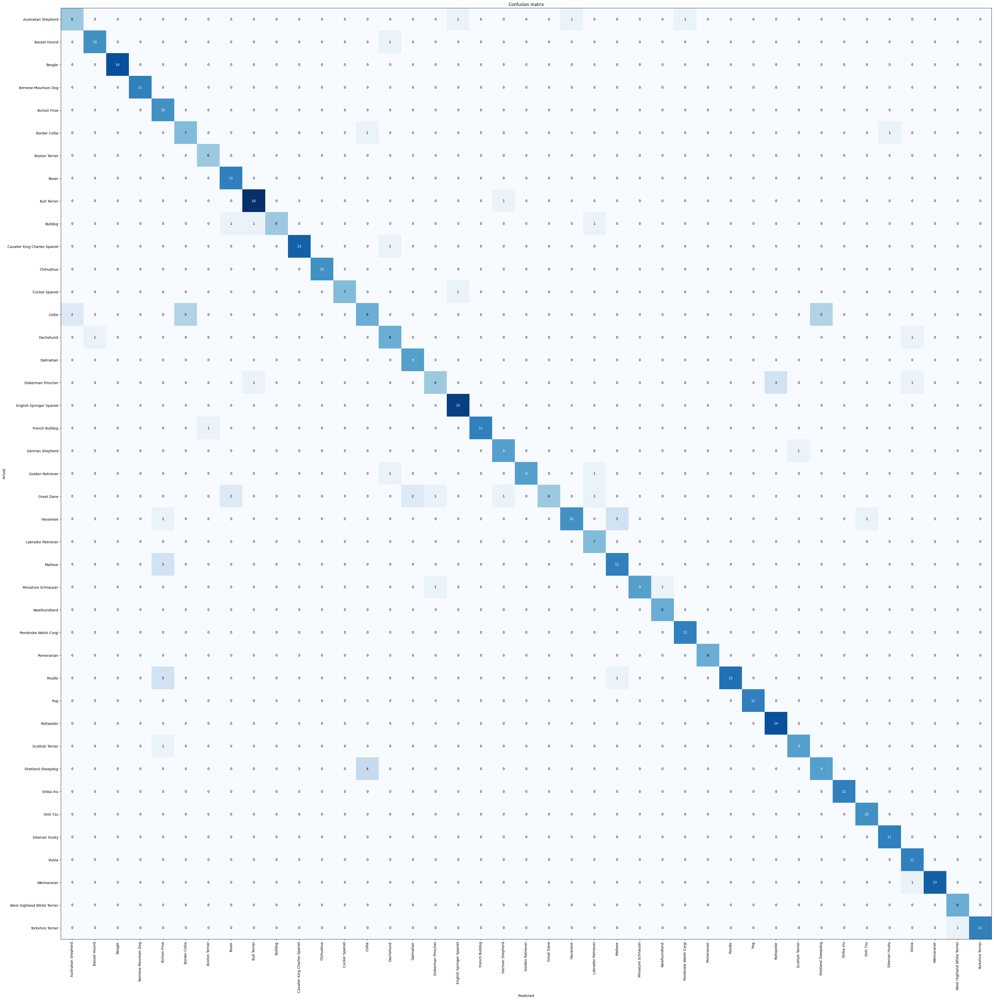

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(40, 40))

In [13]:
learn.export('model.pkl')